In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('df_nota_redac_ausente.csv')

In [3]:
df.head(2)

,id,gp_idade,sexo,est_civil,raca,sit_ens_med,ano_conclusao,tp_escola,tp_ensino,treineiro,present_cien,present_hum,present_port,present_mat,nota_cien,nota_hum,nota_port,nota_mat,esp_ing,nota_redac
0,210057943671,14,M,2,2,1,2,1,0.0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,NaN
1,210057516120,14,M,2,1,1,16,1,0.0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,NaN


In [4]:
df['nota_redac'].isna().sum()

982663

In [5]:
df['nota_redac'].value_counts()

600.0     143777
560.0     140869
580.0     131221
0.0       129827
640.0     115979
620.0     112907
540.0     103907
680.0      98096
520.0      97525
660.0      88881
720.0      86730
760.0      79317
700.0      77423
800.0      75100
840.0      74675
880.0      74374
740.0      69311
480.0      65318
500.0      64209
900.0      64089
780.0      63691
860.0      63254
920.0      63243
820.0      62562
460.0      43853
940.0      42337
360.0      42033
440.0      41878
400.0      28400
420.0      25950
340.0      25411
380.0      21588
960.0      21372
320.0      20957
300.0      10685
280.0       8489
980.0       6042
260.0       3695
240.0       2443
220.0        753
200.0        518
160.0        176
180.0        165
120.0         94
40.0          91
80.0          72
140.0         50
60.0          43
1000.0        32
100.0         30
Name: nota_redac, dtype: int64

In [6]:
df['nota_redac'].describe().round()

count    2493442.0
mean         618.0
std          212.0
min            0.0
25%          520.0
50%          620.0
75%          760.0
max         1000.0
Name: nota_redac, dtype: float64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3476105 entries, 0 to 3476104
Data columns (total 20 columns):
 #   Column         Dtype  
---  ------         -----  
 0   id             int64  
 1   gp_idade       int64  
 2   sexo           object 
 3   est_civil      int64  
 4   raca           int64  
 5   sit_ens_med    int64  
 6   ano_conclusao  int64  
 7   tp_escola      int64  
 8   tp_ensino      float64
 9   treineiro      int64  
 10  present_cien   int64  
 11  present_hum    int64  
 12  present_port   int64  
 13  present_mat    int64  
 14  nota_cien      float64
 15  nota_hum       float64
 16  nota_port      float64
 17  nota_mat       float64
 18  esp_ing        int64  
 19  nota_redac     float64
dtypes: float64(6), int64(13), object(1)
memory usage: 530.4+ MB


In [8]:
#Os valores ausentes em notas de redação são os mesmos ausentes em português, as provas são no mesmo dia, assume-se a ausência em ambas
df.loc[(df['present_port'] == 0) | (df['present_port'] == 2), 'nota_redac'] = 0

In [9]:
df['nota_redac'].isna().sum()

0

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3476105 entries, 0 to 3476104
Data columns (total 20 columns):
 #   Column         Dtype  
---  ------         -----  
 0   id             int64  
 1   gp_idade       int64  
 2   sexo           object 
 3   est_civil      int64  
 4   raca           int64  
 5   sit_ens_med    int64  
 6   ano_conclusao  int64  
 7   tp_escola      int64  
 8   tp_ensino      float64
 9   treineiro      int64  
 10  present_cien   int64  
 11  present_hum    int64  
 12  present_port   int64  
 13  present_mat    int64  
 14  nota_cien      float64
 15  nota_hum       float64
 16  nota_port      float64
 17  nota_mat       float64
 18  esp_ing        int64  
 19  nota_redac     float64
dtypes: float64(6), int64(13), object(1)
memory usage: 530.4+ MB


In [11]:
quant_disciplina= 5
df['media_final']= ((df['nota_cien']+df['nota_hum']+df['nota_port']+df['nota_mat']+df['nota_redac'])/quant_disciplina)

In [12]:
df.head(10)

,id,gp_idade,sexo,est_civil,raca,sit_ens_med,ano_conclusao,tp_escola,tp_ensino,treineiro,...,present_hum,present_port,present_mat,nota_cien,nota_hum,nota_port,nota_mat,esp_ing,nota_redac,media_final
0,210057943671,14,M,2,2,1,2,1,0.0,0,...,0,0,0,0.0,0.0,0.0,0.0,0,0.0,0.00
1,210057516120,14,M,2,1,1,16,1,0.0,0,...,0,0,0,0.0,0.0,0.0,0.0,0,0.0,0.00
2,210057280536,5,F,1,2,1,2,1,0.0,0,...,1,1,1,421.1,546.0,498.8,565.3,1,760.0,558.24
3,210055724397,6,M,1,3,1,2,1,0.0,0,...,1,1,1,490.7,388.6,357.8,416.0,1,320.0,394.62
4,210055097896,4,M,0,3,1,1,1,0.0,0,...,0,0,0,0.0,0.0,0.0,0.0,0,0.0,0.00
5,210057850231,5,F,1,3,1,2,1,0.0,0,...,0,0,0,0.0,0.0,0.0,0.0,1,0.0,0.00
6,210056305481,4,M,1,2,1,2,1,0.0,0,...,0,0,0,0.0,0.0,0.0,0.0,0,0.0,0.00
7,210055778089,6,F,1,2,1,0,1,0.0,0,...,1,1,1,398.1,427.3,400.2,404.9,1,440.0,414.10
8,210057252239,8,F,1,3,1,0,1,0.0,0,...,0,0,0,0.0,0.0,0.0,0.0,1,0.0,0.00
9,210055461467,4,F,1,3,1,1,1,0.0,0,...,1,1,1,467.5,461.0,466.7,435.3,1,360.0,438.10


In [13]:
df['media_final'].describe().round()

count    3476105.0
mean         379.0
std          254.0
min            0.0
25%            0.0
50%          487.0
75%          570.0
max          856.0
Name: media_final, dtype: float64

In [14]:
df['nota_cien'].describe().round()

count    3476105.0
mean         336.0
std          239.0
min            0.0
25%            0.0
50%          443.0
75%          513.0
max          875.0
Name: nota_cien, dtype: float64

In [15]:
df['nota_hum'].describe().round()

count    3476105.0
mean         378.0
std          247.0
min            0.0
25%            0.0
50%          490.0
75%          560.0
max          839.0
Name: nota_hum, dtype: float64

In [16]:
df['nota_port'].describe().round()

count    3476105.0
mean         371.0
std          242.0
min            0.0
25%            0.0
50%          483.0
75%          554.0
max          801.0
Name: nota_port, dtype: float64

In [17]:
df['nota_mat'].describe().round()

count    3476105.0
mean         368.0
std          271.0
min            0.0
25%            0.0
50%          453.0
75%          578.0
max          986.0
Name: nota_mat, dtype: float64

In [18]:
df['nota_redac'].describe().round()

count    3476105.0
mean         444.0
std          331.0
min            0.0
25%            0.0
50%          560.0
75%          700.0
max         1000.0
Name: nota_redac, dtype: float64

In [19]:
df.isna().sum()

id               0
gp_idade         0
sexo             0
est_civil        0
raca             0
sit_ens_med      0
ano_conclusao    0
tp_escola        0
tp_ensino        0
treineiro        0
present_cien     0
present_hum      0
present_port     0
present_mat      0
nota_cien        0
nota_hum         0
nota_port        0
nota_mat         0
esp_ing          0
nota_redac       0
media_final      0
dtype: int64

# visualizaçao

In [20]:
df.head()

,id,gp_idade,sexo,est_civil,raca,sit_ens_med,ano_conclusao,tp_escola,tp_ensino,treineiro,...,present_hum,present_port,present_mat,nota_cien,nota_hum,nota_port,nota_mat,esp_ing,nota_redac,media_final
0,210057943671,14,M,2,2,1,2,1,0.0,0,...,0,0,0,0.0,0.0,0.0,0.0,0,0.0,0.00
1,210057516120,14,M,2,1,1,16,1,0.0,0,...,0,0,0,0.0,0.0,0.0,0.0,0,0.0,0.00
2,210057280536,5,F,1,2,1,2,1,0.0,0,...,1,1,1,421.1,546.0,498.8,565.3,1,760.0,558.24
3,210055724397,6,M,1,3,1,2,1,0.0,0,...,1,1,1,490.7,388.6,357.8,416.0,1,320.0,394.62
4,210055097896,4,M,0,3,1,1,1,0.0,0,...,0,0,0,0.0,0.0,0.0,0.0,0,0.0,0.00


In [21]:
df['tp_ensino'].value_counts()

0.0    2213361
1.0    1255177
2.0       7567
Name: tp_ensino, dtype: int64

- vemos que os 5 mais frequentes sao pessoas de 18 anos, 17 anos, 19 anos, menor de 17 (que seriam treineiros) e 20 anos 

- vemos que sao mais homens

- estado civil em maior parte nao informado ou solteiro

- raça em sua maioria identificados como pardos ou brancos

- ensino medio concluido ou no ano de conclusao, alem de um grande numero de treineiros que sao os identificados por 3

- tipo de ensino ta com 0 em sua maioria que nao sei se seria nao identificado. mas vemos que o numero de educaçao especial e bem mais baixa.

- tipo de escola a amioria nao respondeu ou e de escola publica.

- acho que da pra fazer um grafico ligando o numero de treineiros com a idade 

- ingles e espanhol bem proximos.

In [22]:
import matplotlib.pyplot as plt
import numpy as np

In [23]:
df_new = df.query('gp_idade >= 1 and gp_idade <= 5 and est_civil == 1 and treineiro == 0 and tp_escola == 2 and tp_ensino == 1')

selecionei as pessoas de 17 a 20 anos, solteiras, que estudam em escola publica, com ensino regular e pardos

In [24]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 976884 entries, 26 to 3476102
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   id             976884 non-null  int64  
 1   gp_idade       976884 non-null  int64  
 2   sexo           976884 non-null  object 
 3   est_civil      976884 non-null  int64  
 4   raca           976884 non-null  int64  
 5   sit_ens_med    976884 non-null  int64  
 6   ano_conclusao  976884 non-null  int64  
 7   tp_escola      976884 non-null  int64  
 8   tp_ensino      976884 non-null  float64
 9   treineiro      976884 non-null  int64  
 10  present_cien   976884 non-null  int64  
 11  present_hum    976884 non-null  int64  
 12  present_port   976884 non-null  int64  
 13  present_mat    976884 non-null  int64  
 14  nota_cien      976884 non-null  float64
 15  nota_hum       976884 non-null  float64
 16  nota_port      976884 non-null  float64
 17  nota_mat       976884 non-n

In [25]:
df_new = df_new.query('present_cien == 1 and present_hum == 1 and present_port == 1 and present_mat == 1')

selecionando somente as pessoas que estavam presentes nas provas

In [26]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 703398 entries, 40 to 3476102
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   id             703398 non-null  int64  
 1   gp_idade       703398 non-null  int64  
 2   sexo           703398 non-null  object 
 3   est_civil      703398 non-null  int64  
 4   raca           703398 non-null  int64  
 5   sit_ens_med    703398 non-null  int64  
 6   ano_conclusao  703398 non-null  int64  
 7   tp_escola      703398 non-null  int64  
 8   tp_ensino      703398 non-null  float64
 9   treineiro      703398 non-null  int64  
 10  present_cien   703398 non-null  int64  
 11  present_hum    703398 non-null  int64  
 12  present_port   703398 non-null  int64  
 13  present_mat    703398 non-null  int64  
 14  nota_cien      703398 non-null  float64
 15  nota_hum       703398 non-null  float64
 16  nota_port      703398 non-null  float64
 17  nota_mat       703398 non-n

In [27]:
df_treineiros = df.query('treineiro == 1')

selecionando os alunos treineiros

In [28]:
df_treineiros.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 512732 entries, 17 to 3476062
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   id             512732 non-null  int64  
 1   gp_idade       512732 non-null  int64  
 2   sexo           512732 non-null  object 
 3   est_civil      512732 non-null  int64  
 4   raca           512732 non-null  int64  
 5   sit_ens_med    512732 non-null  int64  
 6   ano_conclusao  512732 non-null  int64  
 7   tp_escola      512732 non-null  int64  
 8   tp_ensino      512732 non-null  float64
 9   treineiro      512732 non-null  int64  
 10  present_cien   512732 non-null  int64  
 11  present_hum    512732 non-null  int64  
 12  present_port   512732 non-null  int64  
 13  present_mat    512732 non-null  int64  
 14  nota_cien      512732 non-null  float64
 15  nota_hum       512732 non-null  float64
 16  nota_port      512732 non-null  float64
 17  nota_mat       512732 non-n

In [29]:
df_treineiros = df_treineiros.query('present_cien == 1 and present_hum == 1 and present_port == 1 and present_mat == 1')

selecionando os treineiros que estavam presente nas provas 

In [30]:
df_treineiros.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 417070 entries, 17 to 3476062
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   id             417070 non-null  int64  
 1   gp_idade       417070 non-null  int64  
 2   sexo           417070 non-null  object 
 3   est_civil      417070 non-null  int64  
 4   raca           417070 non-null  int64  
 5   sit_ens_med    417070 non-null  int64  
 6   ano_conclusao  417070 non-null  int64  
 7   tp_escola      417070 non-null  int64  
 8   tp_ensino      417070 non-null  float64
 9   treineiro      417070 non-null  int64  
 10  present_cien   417070 non-null  int64  
 11  present_hum    417070 non-null  int64  
 12  present_port   417070 non-null  int64  
 13  present_mat    417070 non-null  int64  
 14  nota_cien      417070 non-null  float64
 15  nota_hum       417070 non-null  float64
 16  nota_port      417070 non-null  float64
 17  nota_mat       417070 non-n

In [31]:
df_treineiros.head()

,id,gp_idade,sexo,est_civil,raca,sit_ens_med,ano_conclusao,tp_escola,tp_ensino,treineiro,...,present_hum,present_port,present_mat,nota_cien,nota_hum,nota_port,nota_mat,esp_ing,nota_redac,media_final
17,210056065100,2,F,1,3,3,0,1,0.0,1,...,1,1,1,396.8,528.7,551.4,536.0,0,640.0,530.58
20,210055739197,1,F,1,3,3,0,1,0.0,1,...,1,1,1,466.5,476.2,488.3,462.7,0,0.0,378.74
60,210054659789,2,F,0,3,3,0,1,0.0,1,...,1,1,1,458.9,462.8,458.9,506.2,1,660.0,509.36
63,210056564302,2,F,1,3,3,0,1,0.0,1,...,1,1,1,463.8,531.9,543.8,360.5,0,500.0,480.00
171,210055094382,2,F,1,1,3,0,1,0.0,1,...,1,1,1,483.0,487.3,501.4,540.0,0,0.0,402.34


todos os treineiros estao com o tipo de escola nao informados.

<AxesSubplot:>

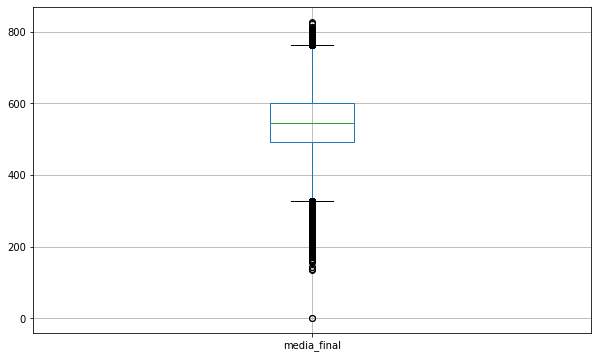

In [32]:
#pensando em fazer um boxplot das notas dos treineiros e um dos alunos alunos 
df_treineiros.boxplot(column = 'media_final', figsize = (10, 6))


In [33]:
df_treineiros['media_final'].mean()

543.3897560601339

In [34]:
df_treineiros['media_final'].median()

545.8

com esse diagrama vemos que a media final fica em torno dos 540, o que seria uma nota mediana no enem. Vemos que temos valores acima dos 700, ultrapassando ate mesmo 800, o que podemos considerar como notas altas, ja que o enem vale 1000. Por outro lado, vemos muitas notas abaixo de 400. Sendo assim, conseguimos perceber uma grande diferença no desempenho dos alunos e nosso produto serviria exatamente para tentar nivelar o conhecimento de todos os alunos.

<AxesSubplot:>

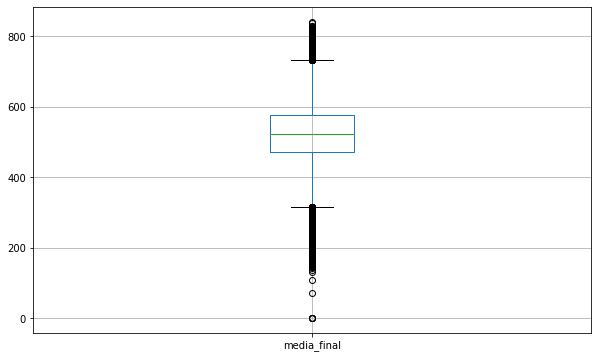

In [35]:
df_new.boxplot(column = 'media_final', figsize = (10, 6))

In [36]:
df_new['media_final'].median()

522.3

In [37]:
df_new['media_final'].mean()

521.8661852322582

Vemos um comportamento bem semelhante nesse diagrama, mas a media das notas esta entre os 520, o que e normal ja que o numero de alunos e maior.

In [38]:
df_new.head()

,id,gp_idade,sexo,est_civil,raca,sit_ens_med,ano_conclusao,tp_escola,tp_ensino,treineiro,...,present_hum,present_port,present_mat,nota_cien,nota_hum,nota_port,nota_mat,esp_ing,nota_redac,media_final
40,210056717205,5,F,1,3,2,0,2,1.0,0,...,1,1,1,436.7,420.0,512.6,430.4,1,560.0,471.94
43,210055243739,4,F,1,1,2,0,2,1.0,0,...,1,1,1,390.1,537.7,442.7,441.4,1,600.0,482.38
49,210056803896,3,F,1,2,2,0,2,1.0,0,...,1,1,1,400.1,379.5,383.1,405.9,1,0.0,313.72
55,210056012033,3,F,1,1,2,0,2,1.0,0,...,1,1,1,819.5,684.9,657.8,905.5,0,900.0,793.54
57,210056292241,2,M,1,3,2,0,2,1.0,0,...,1,1,1,442.4,579.2,582.7,551.9,0,740.0,579.24


In [39]:
porcentagem_amostra = 10


num_linhas_amostra = int(len(df_new) * porcentagem_amostra / 100)


amostra = df_new.sample(n=num_linhas_amostra, random_state=42)  

disciplinas = ['nota_cien', 'nota_hum', 'nota_port', 'nota_mat', 'nota_red', 'media_final']

# Graficos interativos

In [40]:
import plotly.express as px

In [41]:
fig = px.scatter(amostra, x='gp_idade', y='media_final', title='Média Final em relação à Idade',
                 labels={'gp_idade': 'Idade', 'media_final': 'Média Final'})

# Exibir o gráfico interativo
fig.show()

nesse grafico interativo vemos o comportamento das medias finais com a faixa etaria de 17 a 20 anos, que seriam os alunos que acabaram de se formar e que podem estar fazendo cursinho.

amostra do treineiro

In [42]:
porcentagem_amostra = 10


num_linhas_amostra = int(len(df_new) * porcentagem_amostra / 100)


amostra2 = df_treineiros.sample(n=num_linhas_amostra, random_state=42)  


In [43]:
fig = px.scatter(amostra2, x='gp_idade', y='media_final', title='Média Final em relação à Idade',
                 labels={'gp_idade': 'Idade', 'media_final': 'Média Final'})

# Exibir o gráfico interativo
fig.show()

aqui vemos o comportamento da media final dos treineiros, que selecionamos os menores de 17 anos, que seria a idade ideal de concluir a escola.

In [44]:
porcentagem_amostra = 10


num_linhas_amostra = int(len(df_new) * porcentagem_amostra / 100)


amostra3 = df.sample(n=num_linhas_amostra, random_state=42)  


In [45]:
fig = px.scatter(amostra3, x='gp_idade', y='media_final', title='Média Final em relação à Idade',
                 labels={'gp_idade': 'Idade', 'media_final': 'Média Final'})

# Exibir o gráfico interativo
fig.show()

vemos o comportamento das notas no geral, com todas as faixa etarias. Podemos perceber que a partir do grupo 15, as medias finais vao ficando mais consentradas em um intervalo e menos frequentes, o que acredito que indique menos pessoas realizando a prova.